## A simple effect: Delay


### Implementing delay

The simplest delay function will create a copy of the input, add some silence to the beginning of the copy, and combine it with the original input. 

In [1]:
import numpy as np
from scipy.io.wavfile import read
import matplotlib.pyplot as plt
#plt.rcParams['figure.figsize'] = (9,4)
#%config InlineBackend.figure_format = 'svg'
from IPython.display import Audio

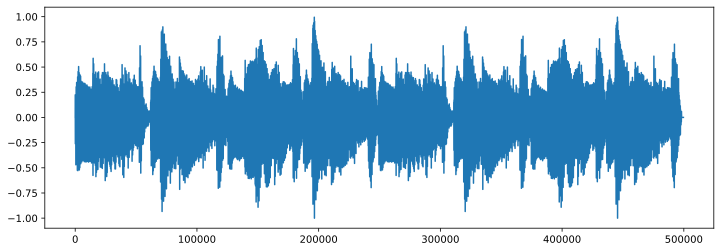

In [2]:
(fs,x) = read('../uploaded_audio/AcousticGuitar.wav')
#Normalize between -1 and 1:
data = x/abs(x).max()
plt.plot(data)

In [3]:
copy = data.copy()

Let's **zero-pad** the original signal and the copied signal so they have the same length

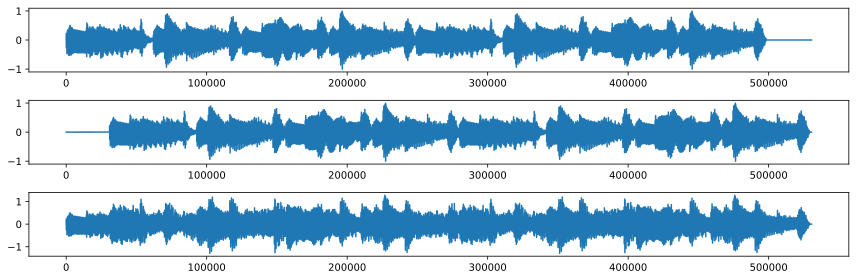

In [4]:
#time in ms to delay by
offset = 700
#create number of samples equal to 700ms under the given sampling rate
pad = np.zeros(int(fs/1000*offset))
orig = np.concatenate([data,pad])
delay = np.concatenate([pad,copy])
new_s = orig+delay
plt.subplot(3,1,1)
plt.plot(orig)
plt.subplot(3,1,2)
plt.plot(delay)
plt.subplot(3,1,3)
plt.plot(new_s)
plt.tight_layout()

In [5]:
Audio(orig, rate=fs)

In [6]:
Audio(new_s, rate=fs)

To make this sound more like a realistic echo, we can change the volume of the delayed audio by scaling the amplitude on the delay (copy) file.

In [7]:
delay2 = delay*.5
new_s2 = orig+delay2
Audio(new_s2, rate=fs)

In [8]:
#time in ms to delay by
offset = 350 # started at 700
#create number of samples equal to N ms under the given sampling rate
pad = np.zeros(int(fs/1000*offset))
orig = np.concatenate([data,pad])
delay = np.concatenate([pad,copy])
new_s = orig+delay
Audio(new_s,rate=fs)

Another enhancement to the delay function is to allow for multiple repeats. 
Each time a repeat occurs, we can opt to scale the volume of each repeat (or not).

Let's try 3 repeats each with a 1000ms delay:

In [9]:
#First delay
#time in ms to delay by
offset = 1000
#create silence equal to number of samples equal to 1000ms under the given sampling rate
pad = np.zeros(int(fs/1000*offset))
#orig = np.concatenate([data,pad])
orig = np.concatenate([copy,pad,pad,pad])
delay1 = np.concatenate([pad,copy,pad,pad])
delay2 = np.concatenate([pad,pad,copy,pad])
delay3 = np.concatenate([pad,pad,pad,copy])
new_s = orig+(delay1*.5)+(delay2*.25)+(delay3*.125)
Audio(new_s,rate=fs)

Notice that the process of padding and concatenating can easily be turned into an iterative process...

In [10]:
iters = []
repeats = 3
for i in range(repeats+1):
    offset = 1000
    #create some silence
    pad_beg = np.zeros(int(fs/1000*offset*i))
    pad_end = np.zeros(int(fs/1000*offset*(repeats-i)))
    # add to the original starting from first delay
    delay=np.concatenate([pad_beg,copy,pad_end])
    iters.append(delay)
newnew_s = np.sum(np.array(iters),axis=0)

Or, better, without any loops:

In [11]:
import numpy as np
a = np.arange(10)
np.roll(a,2)

array([8, 9, 0, 1, 2, 3, 4, 5, 6, 7])

In [12]:
repeats = 3
offset = 700
pad = np.zeros(int(fs/1000*offset))
delay = np.concatenate([copy, np.tile(pad, 3)])
delay += np.roll(delay, pad.size)

In [13]:
Audio(delay, rate=fs)

### Comb filters & delay

A signal added to a delayed version of itself, at smaller intervals can create a comb filter. As above, if a sinusoidal component of a sound is delayed by exactly one cycle (i.e., one period) or any whole number of cycles, and mixed with the original sound, that component will be reinforced; conversely, if a component is delayed by one-half period, it will be cancelled.The delay determines the spacing between the notches in the comb filter's frequency response. A handy formula to calculate the relation between a frequency in Hz and a delay in seconds is given by:

$f = \frac{1}{T}$

where $f$ is the frequency of the first peak or notch, and $T$ is the delay time in seconds. For example, a 100Hz tone has a periodicity of 100/sec (or 100 per 1000 ms) and therefore 1 full cycle in 10ms. A delay of 10ms will therefore create complete constructive interference at 100Hz. Accordingly, a 100Hz tone delayed (or phase-shifted) by half of that (5ms) will have the result of complete destructive interference (i.e., notch) at 100Hz (but complete constructive interference at 200Hz). We can convert from ms to samples depending on the sampling rate. Subsequent notches or peaks occur at integer multiples of this fundamental frequency.

This regular harmonic pattern of resonance and attenuation is known as *comb filtering*.

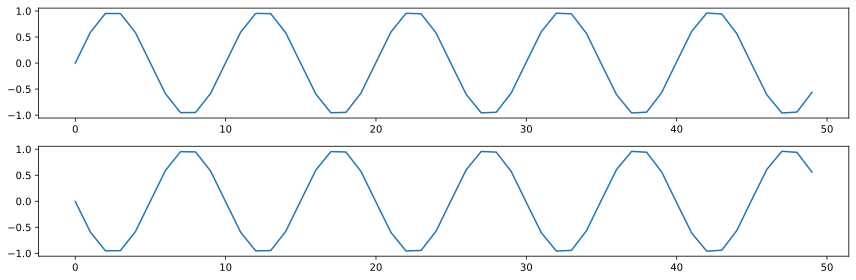

In [14]:
t = np.linspace(0,1,1000)
s = np.sin(2 * np.pi * 100 * t)

fig, ax = plt.subplots(2, 1, layout='tight')
ax[0].plot(s[:50])
ax[1].plot(s[5:55])# 5 ms delay

In [21]:
#First delay
#time in ms to delay by
offset = 5 # 5/1000 = .005, 1/.005 = 200hz
#create silence equal to number of samples equal to 1000ms under the given sampling rate
pad = np.zeros(int(fs/1000*offset))
#orig = np.concatenate([data,pad])
orig = np.concatenate([copy,pad,pad,pad])
delay1 = np.concatenate([pad,copy,pad,pad])
delay2 = np.concatenate([pad,pad,copy,pad])
delay3 = np.concatenate([pad,pad,pad,copy])
new_s = orig+(delay1*.5)+(delay2*.25)+(delay3*.125)
Audio(new_s,rate=fs)